In [1]:
# !pip install pycaret[all] --quiet
# !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip --quiet
# !pip install catboost --quiet
# !pip install xgboost --quiet

In [2]:
# cd "/content/drive/MyDrive/My Data Files/"

In [3]:
!ls

catboost_info  drive  logs.log	sample_data


In [4]:
from pycaret.utils import enable_colab, version
enable_colab()
version()

Colab mode enabled.


'2.3.0'

In [5]:
from pandas_profiling import ProfileReport
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from pycaret.regression import *
from scipy.stats import skew, pearsonr
from scipy import stats

pd.set_option('display.max_columns', None)  # or 1000
pd.set_option('display.max_rows', None)  # or 1000
pd.set_option('display.max_colwidth', -1)  # or 199

sns.set_style("darkgrid")

In [6]:
df_train = pd.read_csv("/content/drive/MyDrive/My Data Files/train.csv")
df_test = pd.read_csv("/content/drive/MyDrive/My Data Files/test.csv")

df_train.shape,df_test.shape

((1460, 81), (1459, 80))

In [7]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [8]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [46]:
numeric_feats = df_train.dtypes[df_train.dtypes != 'object'].index
profile = ProfileReport(df_train[numeric_feats[1:11]], title="Features Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

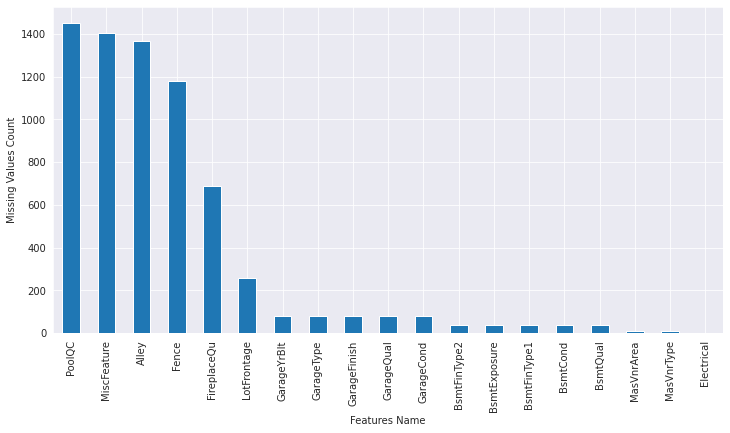

In [10]:
null_columns_names = list( df_train.columns[df_train.isnull().any()] )
null_columns = df_train[null_columns_names].isnull().sum().sort_values(ascending=False)

plt.figure(figsize=(12,6))

null_columns.plot.bar()
plt.xlabel("Features Name")
plt.ylabel("Missing Values Count")
plt.show()

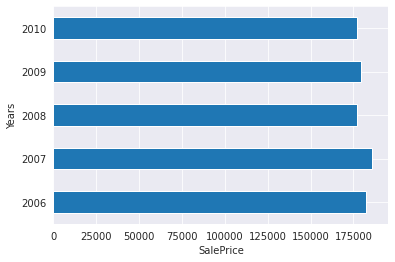

In [11]:
yearly_mean = df_train.groupby('YrSold')['SalePrice'].mean()

yearly_mean.plot.barh()
plt.xlabel("SalePrice")
plt.ylabel("Years")
plt.show()

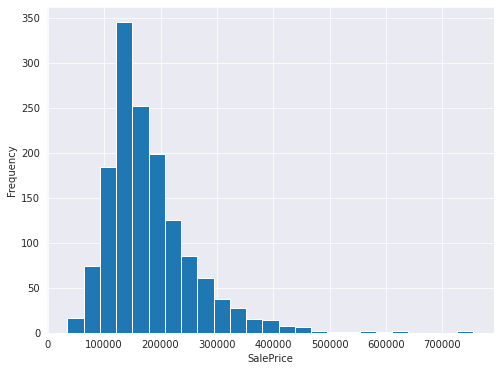

In [12]:
plt.figure(figsize=(8,6))
df_train["SalePrice"].hist(bins=25);

plt.xlabel("SalePrice")
plt.ylabel("Frequency")
plt.show()

In [13]:
df_train[df_train['SalePrice'] >= 650000]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455,Unf,0,989,2444,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0,1,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0,Fin,3,832,TA,TA,Y,382,50,0,0,0,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,5,1996,1996,Hip,CompShg,Wd Sdng,ImStucc,None,0.0,Gd,TA,PConc,Ex,TA,Av,GLQ,2096,Unf,0,300,2396,GasA,Ex,Y,SBrkr,2411,2065,0,4476,1,0,3,1,4,1,Ex,10,Typ,2,TA,Attchd,1996.0,Fin,3,813,TA,TA,Y,171,78,0,0,0,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


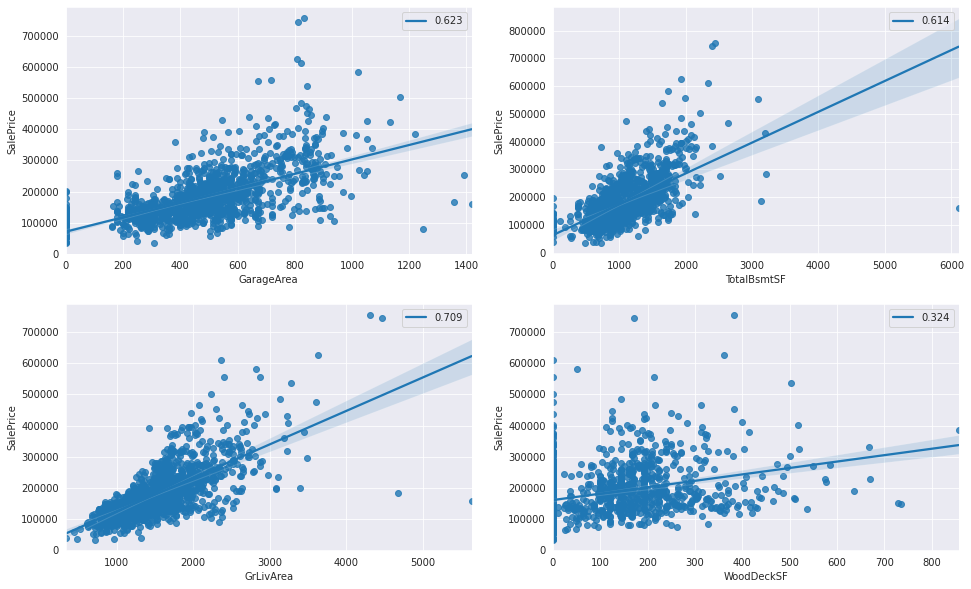

In [14]:
plt.figure(figsize=(16,10))

for i,feature in enumerate(["GarageArea","TotalBsmtSF","GrLivArea","WoodDeckSF"]):
    plt.subplot(2,2,i+1)
    ax = sns.regplot(x=df_train[feature], y=df_train["SalePrice"]);
    ax.legend([str(round(pearsonr(df_train[feature], df_train["SalePrice"])[0],3))])

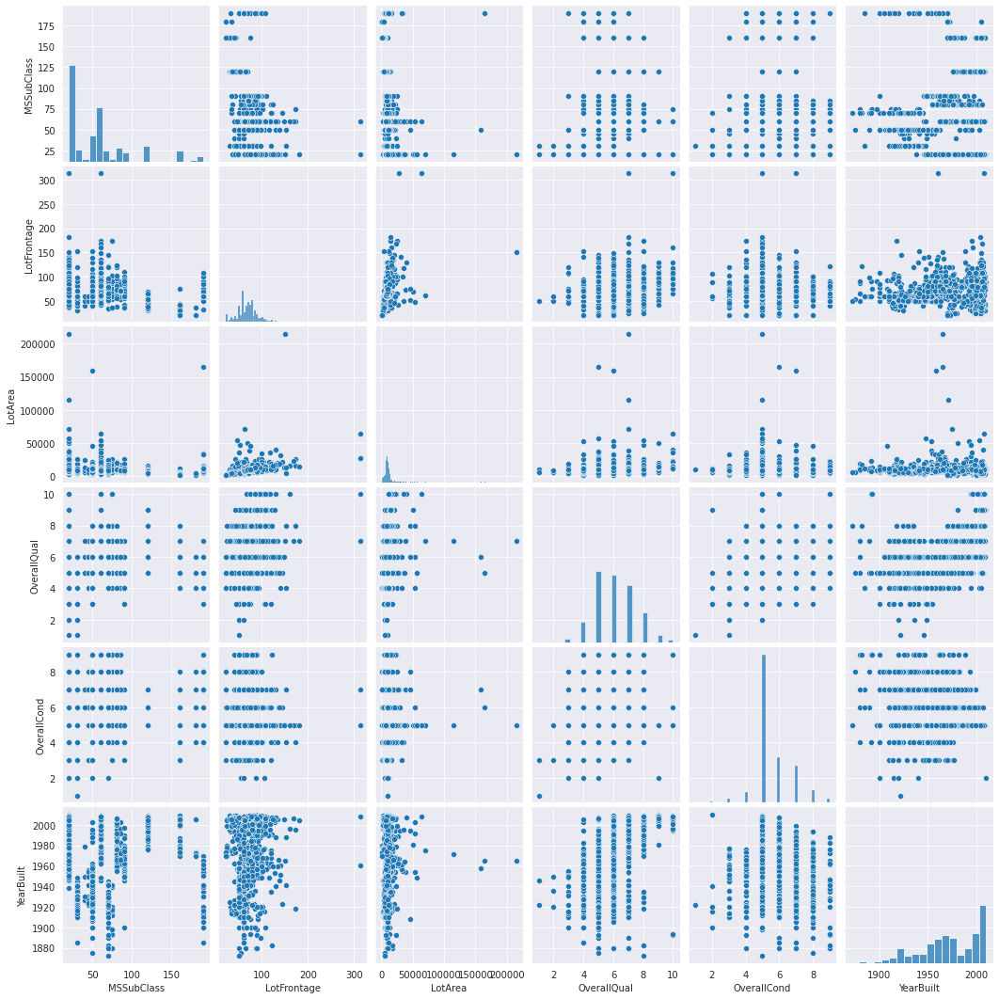

In [15]:
numeric_feats = df_train.dtypes[df_train.dtypes != 'object'].index
sns.pairplot(df_train[numeric_feats[1:7]], palette='hls');

# Data Pre-Processing

In [16]:
df_train = df_train[df_train['SalePrice'] <= 650000]
df_train['SalePrice'] = np.log1p(df_train["SalePrice"])

In [17]:
y = df_train.pop('SalePrice')
df_train.drop("Id", axis=1, inplace=True)
test_id = df_test.pop('Id')

df_train.shape,df_test.shape


((1458, 79), (1459, 79))

In [18]:
data = pd.concat([df_train, df_test], axis=0, sort=False)

assert((df_train.shape[0]+df_test.shape[0]) == data.shape[0])
data.shape

(2917, 79)

In [19]:
data["Alley"] = data["Alley"].replace(np.nan, "No Alley")
data["Fence"] = data["Fence"].replace(np.nan, "No Fence")
data["PoolQC"] = data["PoolQC"].replace(np.nan, "No Pool")
# data["BsmtQual"] = data["BsmtQual"].replace(np.nan, "No Basement")
# data["BsmtQual"] = data["BsmtQual"].replace(np.nan, "No Basement")

# data["PoolQC"].unique()

In [20]:
# data["ExterQual"].unique(),data["ExterCond"].unique()

In [21]:
columns = data.columns
numeric_features =[]

for i in columns:
  if data[i].dtype.name != "object":
    numeric_features.append(i)

print("Numerical Features with null values:\n",numeric_features)
len(numeric_features)

Numerical Features with null values:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


36

In [22]:
categorical_features =[]

for i in columns:
  if data[i].dtype.name == "object":
    categorical_features.append(i)

print("Categorical Features with null values:\n",categorical_features)
len(categorical_features)

Categorical Features with null values:
 ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


43

In [23]:
for feature in numeric_features:
    data[feature] = data[feature].fillna( data[feature][:len(df_train)].median() )

for feature in categorical_features:
    data[feature] = data[feature].fillna( str( data[feature][:len(df_train)].value_counts().index[0] ))

In [24]:
data['TotalBsmtSF'] = data['TotalBsmtSF'] + data['1stFlrSF'] + data['2ndFlrSF']
data['SumOverAll'] = data['OverallQual'] + data['OverallCond']
data['BsmtTotalBath'] = data['BsmtFullBath'] + data['BsmtHalfBath']
# ExterQual,ExterCond


In [25]:
data.shape

(2917, 81)

In [26]:
numeric_feats = data.dtypes[data.dtypes != 'object'].index
numeric_feats
len(numeric_feats)

38

In [27]:
skewed_feats = data[numeric_features].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skewed_feats[abs(skewed_feats) > 0.5]
high_skew

MiscVal          21.939672
PoolArea         17.782130
LotArea          12.835958
LowQualFinSF     12.084539
3SsnPorch        11.372080
KitchenAbvGr     4.300550 
BsmtFinSF2       4.144503 
EnclosedPorch    4.002344 
ScreenPorch      3.945101 
BsmtHalfBath     3.944494 
MasVnrArea       2.593048 
OpenPorchSF      2.534984 
WoodDeckSF       1.845916 
LotFrontage      1.647769 
1stFlrSF         1.468311 
TotalBsmtSF      1.465815 
BsmtFinSF1       1.423926 
MSSubClass       1.375131 
GrLivArea        1.191733 
BsmtUnfSF        0.920131 
2ndFlrSF         0.843515 
TotRmsAbvGrd     0.758807 
Fireplaces       0.734238 
HalfBath         0.696666 
BsmtFullBath     0.625237 
OverallCond      0.570142 
YearBuilt       -0.598699 
dtype: float64

In [28]:
len(high_skew.index)

27

In [29]:
for feat in high_skew.index:
    data[feat] = np.log1p(data[feat])

In [30]:
train = data[:len(df_train)]
test = data[len(df_train):]

train.shape,test.shape

((1458, 81), (1459, 81))

In [31]:
train["SalePrice"] = y

In [32]:
train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SumOverAll,BsmtTotalBath,SalePrice
0,4.110874,RL,4.189655,9.042040,Pave,No Alley,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,1.791759,7.602900,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.283204,Gd,TA,PConc,Gd,TA,No,GLQ,6.561031,Unf,0.0,5.017280,7.850493,GasA,Ex,Y,SBrkr,6.753438,6.751101,0.0,7.444833,0.693147,0.000000,2,0.693147,3,0.693147,Gd,2.197225,Typ,0.000000,Gd,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0.000000,4.127134,0.000000,0.0,0.0,0.0,No Pool,No Fence,Shed,0.0,2,2008,WD,Normal,12,1.0,12.247699
1,3.044522,RL,4.394449,9.169623,Pave,No Alley,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,2.197225,7.589336,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,6.886532,Unf,0.0,5.652489,7.833996,GasA,Ex,Y,SBrkr,7.141245,0.000000,0.0,7.141245,0.000000,0.693147,2,0.000000,3,0.693147,TA,1.945910,Typ,0.693147,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,5.700444,0.000000,0.000000,0.0,0.0,0.0,No Pool,No Fence,Shed,0.0,5,2007,WD,Normal,14,1.0,12.109016
2,4.110874,RL,4.234107,9.328212,Pave,No Alley,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,1.791759,7.601902,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.093750,Gd,TA,PConc,Gd,TA,Mn,GLQ,6.188264,Unf,0.0,6.075346,7.903596,GasA,Ex,Y,SBrkr,6.825460,6.765039,0.0,7.488294,0.693147,0.000000,2,0.693147,3,0.693147,Gd,1.945910,Typ,0.693147,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0.000000,3.761200,0.000000,0.0,0.0,0.0,No Pool,No Fence,Shed,0.0,9,2008,WD,Normal,12,1.0,12.317171
3,4.262680,RL,4.110874,9.164401,Pave,No Alley,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,1.791759,7.557995,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,5.379897,Unf,0.0,6.293419,7.813592,GasA,Gd,Y,SBrkr,6.869014,6.629363,0.0,7.448916,0.693147,0.000000,1,0.000000,3,0.693147,Gd,2.079442,Typ,0.693147,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0.000000,3.583519,5.609472,0.0,0.0,0.0,No Pool,No Fence,Shed,0.0,2,2006,WD,Abnorml,12,1.0,11.849405
4,4.110874,RL,4.442651,9.565284,Pave,No Alley,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,1.791759,7.601402,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.860786,Gd,TA,PConc,Gd,TA,Av,GLQ,6.486161,Unf,0.0,6.196444,8.114923,GasA,Ex,Y,SBrkr,7.044033,6.960348,0.0,7.695758,0.693147,0.000000,2,0.693147,4,0.693147,Gd,2.302585,Typ,0.693147,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,5.262690,4.442651,0.000000,0.0,0.0,0.0,No Pool,No Fence,Shed,0.0,12,2008,WD,Normal,13,1.0,12.429220


In [33]:
# ignore_columns = ['PoolQC', 'MiscFeature', 'Alley']

# ordinal_features = {'BsmtQual': ['No Basement', 'Fa', 'TA', 'Gd', 'Ex'],
#                     'Fence' : ['No Fence','MnWw','GdWo','MnPrv','GdPrv'],
#                     'PoolQC' : ['No Pool', 'Fa', 'Gd', 'Ex'],
#                     'KitchenQual' : ['Fa', 'TA', 'Gd', 'Ex']
#                     }

# data['PoolQC'].unique()

# Data Modelling

In [34]:
exp_reg101 = setup(data = train,
                   target = 'SalePrice',
                   normalize = True,
                  #  ordinal_features =  ordinal_features,
                   train_size = 0.999,
                   session_id = 786) 


,Description,Value
0,session_id,786
1,Target,SalePrice
2,Original Data,"(1458, 82)"
3,Missing Values,False
4,Numeric Features,32
5,Categorical Features,49
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1456, 337)"


In [35]:
X_train = get_config("X_train")
X_train.head()

,MSSubClass,LotFrontage,LotArea,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,HalfBath,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,BsmtTotalBath,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Grvl,Alley_No Alley,...,MoSold_6,MoSold_7,MoSold_8,MoSold_9,YrSold_2006,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SumOverAll_10,SumOverAll_11,SumOverAll_12,SumOverAll_13,SumOverAll_14,SumOverAll_15,SumOverAll_16,SumOverAll_17,SumOverAll_19,SumOverAll_2,SumOverAll_4,SumOverAll_5,SumOverAll_6,SumOverAll_7,SumOverAll_8,SumOverAll_9
1235,0.645779,1.151267,0.720698,-0.460545,-1.904775,-1.686614,-0.807625,-1.413552,-0.354705,0.522951,0.112454,-0.673367,1.195179,-0.133789,0.664502,-0.8328,-0.241689,1.259405,-0.207905,1.443293,-1.014030,-2.689080,-1.026000,-1.370432,1.104702,0.653432,-0.40489,-0.128701,-0.291847,-0.064309,-0.190752,-0.896064,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1216,1.006400,0.065119,-0.024900,-0.460545,0.231245,-0.330992,-0.807625,-1.413552,-0.354705,-3.055389,-0.805329,0.560058,1.066628,-0.133789,0.858124,-0.8328,-0.241689,-0.769061,4.329815,0.950268,-1.014030,-0.022634,0.313781,0.310597,-0.945304,-1.071767,-0.40489,-0.128701,-0.291847,-0.064309,-0.190752,-0.896064,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1327,-1.124279,-0.327857,-0.609441,2.570612,0.362457,1.121461,-0.807625,0.748439,-0.354705,-0.259465,-1.297078,-0.954645,-0.869829,-0.133789,-1.699408,-0.8328,4.040898,-0.769061,-0.207905,-0.947069,0.745505,0.144019,-1.026000,-0.977099,-0.945304,-1.071767,-0.40489,-0.128701,-0.291847,-0.064309,-0.190752,0.962440,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
245,-1.124279,0.576433,0.269732,-0.460545,0.558764,0.153159,0.956971,0.872379,-0.354705,0.633104,1.347113,1.668971,-0.869829,-0.133789,0.810061,-0.8328,4.040898,-0.769061,-0.207905,-0.225735,0.745505,0.393998,0.313781,0.614962,1.093195,0.641961,-0.40489,-0.128701,-0.291847,-0.064309,-0.190752,0.962440,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1073,0.425195,0.373251,-0.249642,0.454160,0.198403,-0.379407,1.076533,0.688088,-0.354705,-0.324695,-0.462842,-1.447925,1.133509,-0.133789,-0.012560,-0.8328,-0.241689,1.259405,-0.207905,-0.225735,-1.014030,-0.064298,0.313781,-0.152973,1.187683,-1.071767,-0.40489,-0.128701,-0.291847,-0.064309,-0.190752,-0.896064,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
X_train.shape

(1456, 337)

In [37]:
best = compare_models(sort="RMSE")

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.0774,0.0138,0.1161,0.9104,0.0090,0.0065,9.021
lightgbm,Light Gradient Boosting Machine,0.0854,0.0166,0.1275,0.8929,0.0099,0.0072,0.299
gbr,Gradient Boosting Regressor,0.0871,0.0167,0.1280,0.8915,0.0099,0.0073,0.972
br,Bayesian Ridge,0.0815,0.0170,0.1280,0.8888,0.0099,0.0068,0.166
omp,Orthogonal Matching Pursuit,0.0858,0.0172,0.1291,0.8878,0.0100,0.0072,0.038
ridge,Ridge Regression,0.0836,0.0183,0.1322,0.8805,0.0102,0.0070,0.035
xgboost,Extreme Gradient Boosting,0.0942,0.0188,0.1359,0.8791,0.0105,0.0079,7.111
et,Extra Trees Regressor,0.0944,0.0190,0.1370,0.8762,0.0106,0.0079,3.204
rf,Random Forest Regressor,0.0944,0.0194,0.1382,0.8739,0.0107,0.0079,3.113
huber,Huber Regressor,0.0918,0.0232,0.1500,0.8494,0.0116,0.0077,0.423


In [38]:
best

In [39]:
model = create_model(best)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.0728,0.0129,0.1136,0.9248,0.0089,0.0061
1,0.0884,0.0197,0.1403,0.8364,0.0108,0.0074
2,0.0873,0.0197,0.1402,0.8900,0.0111,0.0074
3,0.0680,0.0093,0.0966,0.9409,0.0074,0.0057
4,0.0767,0.0127,0.1129,0.9157,0.0086,0.0064
5,0.0703,0.0091,0.0951,0.9380,0.0073,0.0058
6,0.0666,0.0086,0.0928,0.9379,0.0072,0.0055
7,0.0852,0.0183,0.1354,0.9031,0.0105,0.0071
8,0.0817,0.0150,0.1223,0.9059,0.0094,0.0069
9,0.0774,0.0126,0.1121,0.9116,0.0088,0.0065


In [40]:
# tuned_model = tune_model(model, n_iter=50, optimize = "RMSE");

# Model Evaluation

In [41]:
evaluate_model(model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

In [42]:
# evaluate_model(tuned_model)

In [43]:
y_pred = predict_model(model, data = test)
# tuned_pred = predict_model(tuned_model, data = test)

result_df = pd.DataFrame({
    "y" : np.expm1(y[0:1000]),
    "y_pred": np.expm1(y_pred['Label'][0:1000]),
    # "tuned_model": np.expm1(tuned_pred['Label'][0:1000])
})

result_df.describe()

,y,y_pred
count,1000.000000,1000.000000
mean,181611.451000,180286.998270
std,78281.297024,75242.315469
min,34900.000000,49604.358215
25%,130000.000000,128484.774831
50%,163745.000000,160222.624023
75%,215000.000000,212964.629761
max,611657.000000,463584.092917


In [44]:
new_df = pd.DataFrame({
    'Id': test_id,
    'SalePrice': np.expm1(y_pred['Label'])
})

new_df.head()

,Id,SalePrice
0,1461,123794.547463
1,1462,158655.782204
2,1463,194453.371197
3,1464,202921.812193
4,1465,178883.163338


In [45]:
new_df.to_csv("model_predictions.csv", index=False)